In [74]:
import torch
import numpy as np
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

from utils.config import load_config
from utils.notebook import display_batch, imshow, image_from_tensor
from utils.masking import mask_batch
from ml.UNet import UNet
from ml.SimpleGenerator import SimpleGenerator
from ml.DeepFill import DeepFill

In [75]:
config = load_config("../config.toml")
image_size = config["files"]["image_size"]
batch_size = config["train"]["batch_size"]
workers = config["train"]["workers"]
MODEL_DIR = "../models"


dataroot = "../images/test"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [76]:
config = load_config("../config_deepfill.toml")
image_size = config["files"]["image_size"]
batch_size = config["train"]["batch_size"]
workers = config["train"]["workers"]
MODEL_DIR = "../models"

dataroot = "../images/test"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [77]:
dataset = ImageFolder(root=dataroot, transform=Compose([
    Resize((image_size, image_size)),
    ToTensor(),
    Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

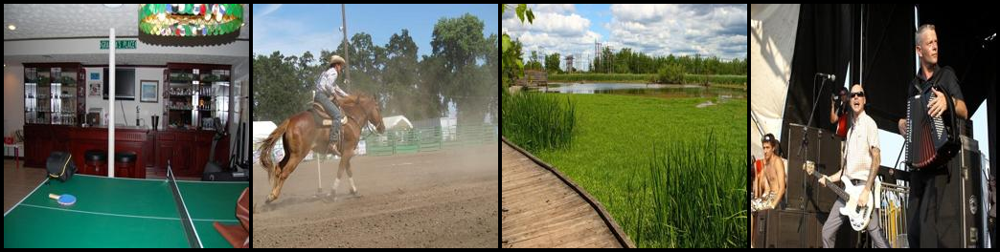

In [78]:
dl_iter = iter(dataloader)
real_batch = next(dl_iter)
display_batch(real_batch)

In [79]:
def load_generator(checkpoint_path, model, device, **kwargs):
    G_weights = torch.load(f"{MODEL_DIR}/{checkpoint_path}")
    netG = model(device, **kwargs)
    netG.load_state_dict(G_weights)
    netG.to(device)
    return netG

In [100]:
def eval_generator(checkpoint_path, model, test_batch, device, **kwargs):
    test_mask = mask_batch(test_batch, device=device).to(device)
    netG = load_generator(checkpoint_path, model, device, **kwargs)
    with torch.no_grad():
        res = netG(test_mask)
        if len(res) == 2 and isinstance(res, tuple):
            res = res[1]
        for i in range(batch_size):
            img = test_mask[i][:3, ...]
            img_real = test_batch[i][:3, ...]
            imshow(np.concatenate([image_from_tensor(img_real), image_from_tensor(img), image_from_tensor(res[i])], axis=1))

In [83]:
test_batch = next(dl_iter)[0].to(device)

eval_generator(G_CKPT, UNet, test_batch, device)

FileNotFoundError: [Errno 2] No such file or directory: '../models/checkpoints/best_generator_20260126_012907.pth'

In [23]:
test_batch = next(dl_iter)
eval_generator("checkpoints/generator_20260119_161009_iter50.pth", UNet, test_batch[0], device)

FileNotFoundError: [Errno 2] No such file or directory: '../models/checkpoints/generator_20260119_161009_iter50.pth'

## Best

In [86]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_best.pth", SimpleGenerator, test_batch[:, :3, ...], device)

RuntimeError: Given groups=1, weight of size [64, 3, 5, 5], expected input[4, 4, 256, 256] to have 3 channels, but got 4 channels instead

## DeepFill

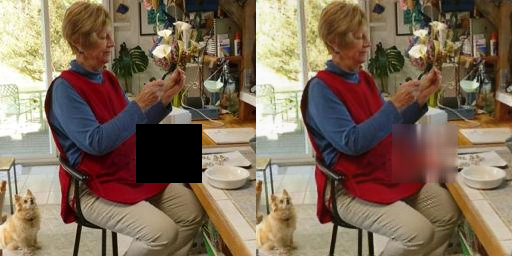

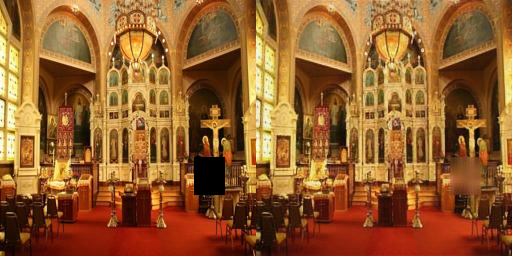

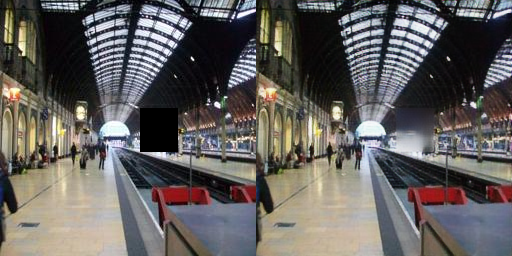

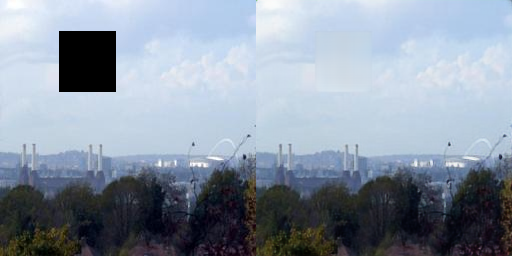

In [87]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_050942.pth", DeepFill, test_batch, device, cnum=32)

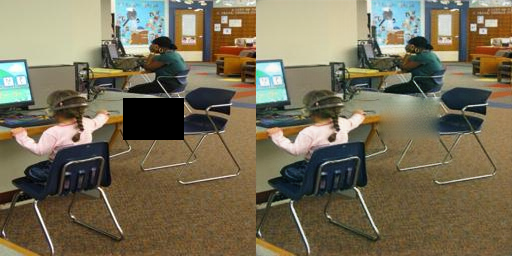

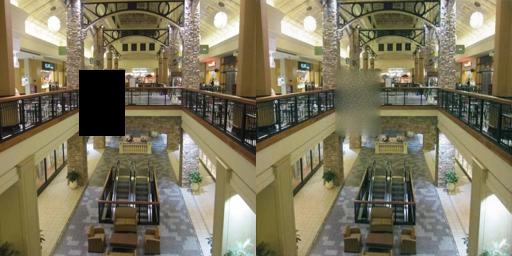

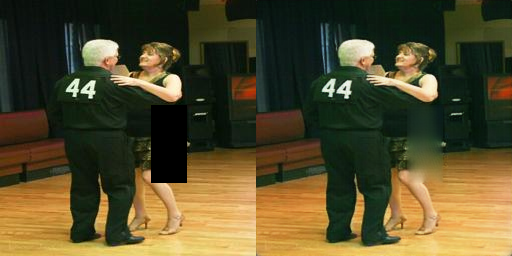

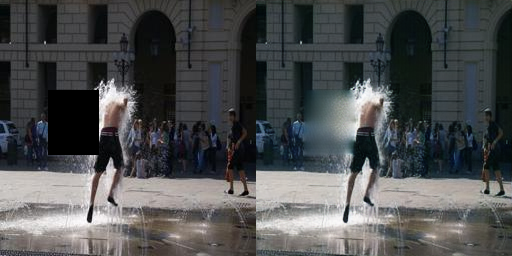

In [88]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_063426.pth", DeepFill, test_batch, device, cnum=32)

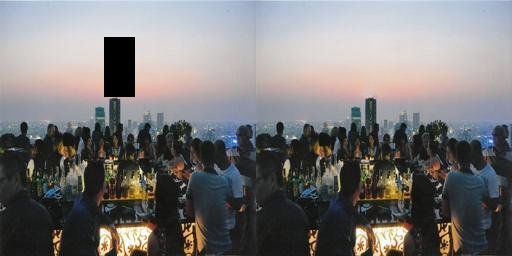

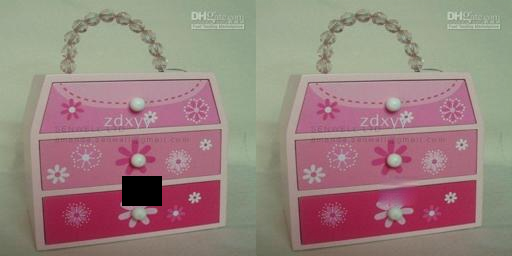

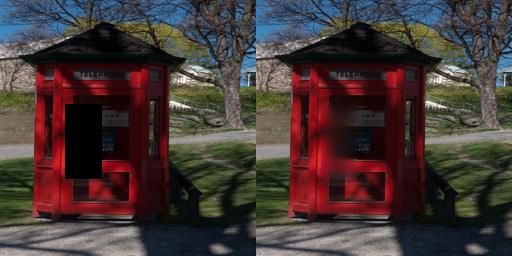

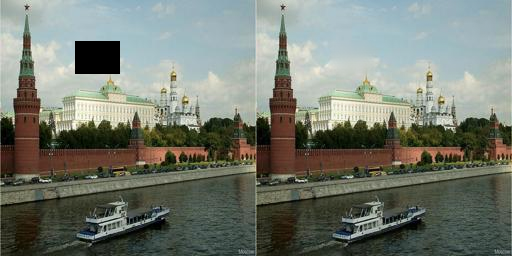

In [92]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_070530.pth", DeepFill, test_batch, device, cnum=32)

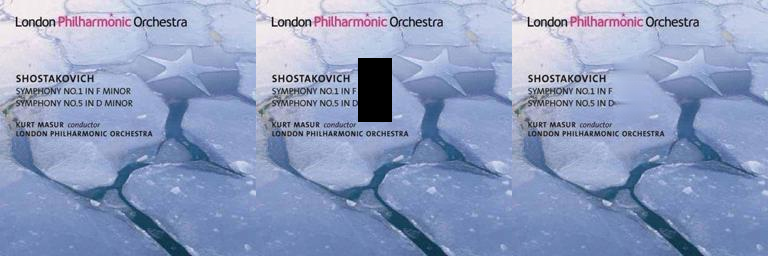

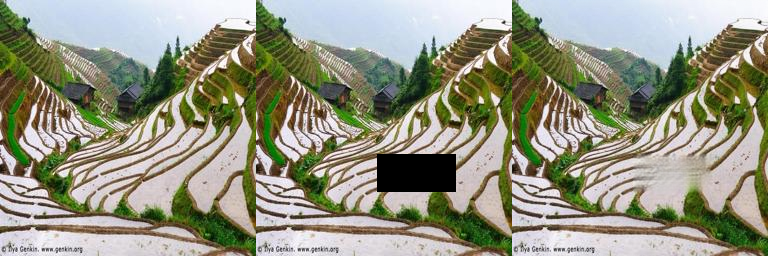

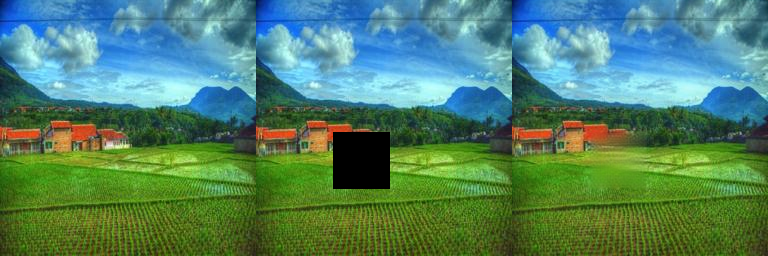

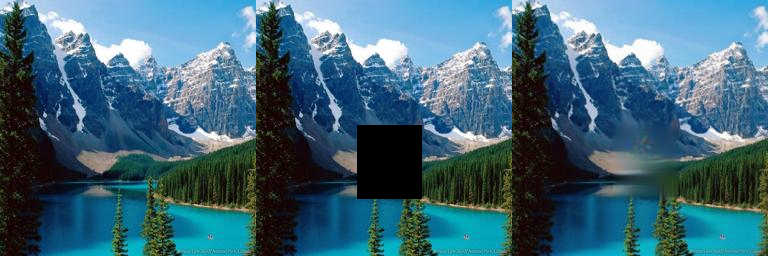

In [121]:
test_batch = next(dl_iter)[0].to(device)
eval_generator("generator_20260127_070530.pth", DeepFill, test_batch, device, cnum=32)

In [50]:
from torchvision.utils import make_grid

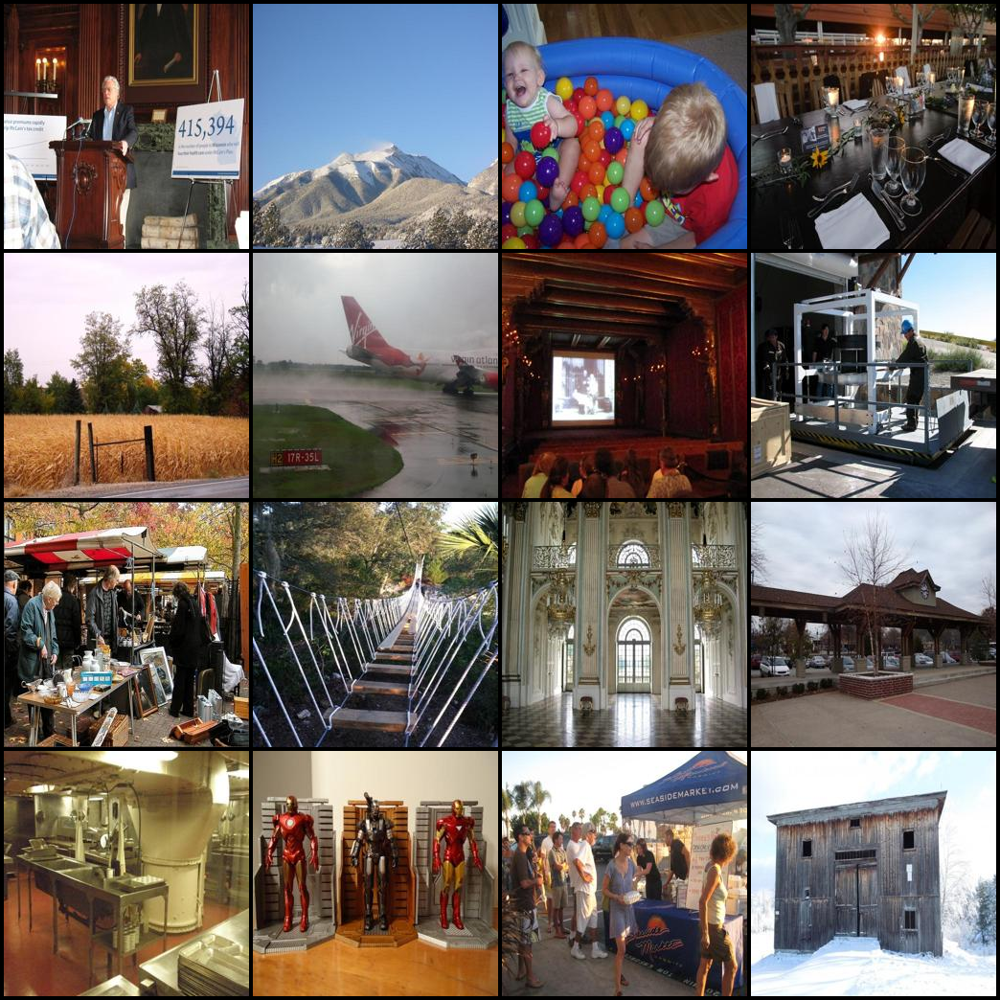

In [51]:
dataloader2 = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=workers)
dl_iter2 = iter(dataloader2)
test_batch = next(dl_iter2)[0]
grid = make_grid(test_batch, padding=4, normalize=True, nrow=4)
imshow(image_from_tensor(grid))

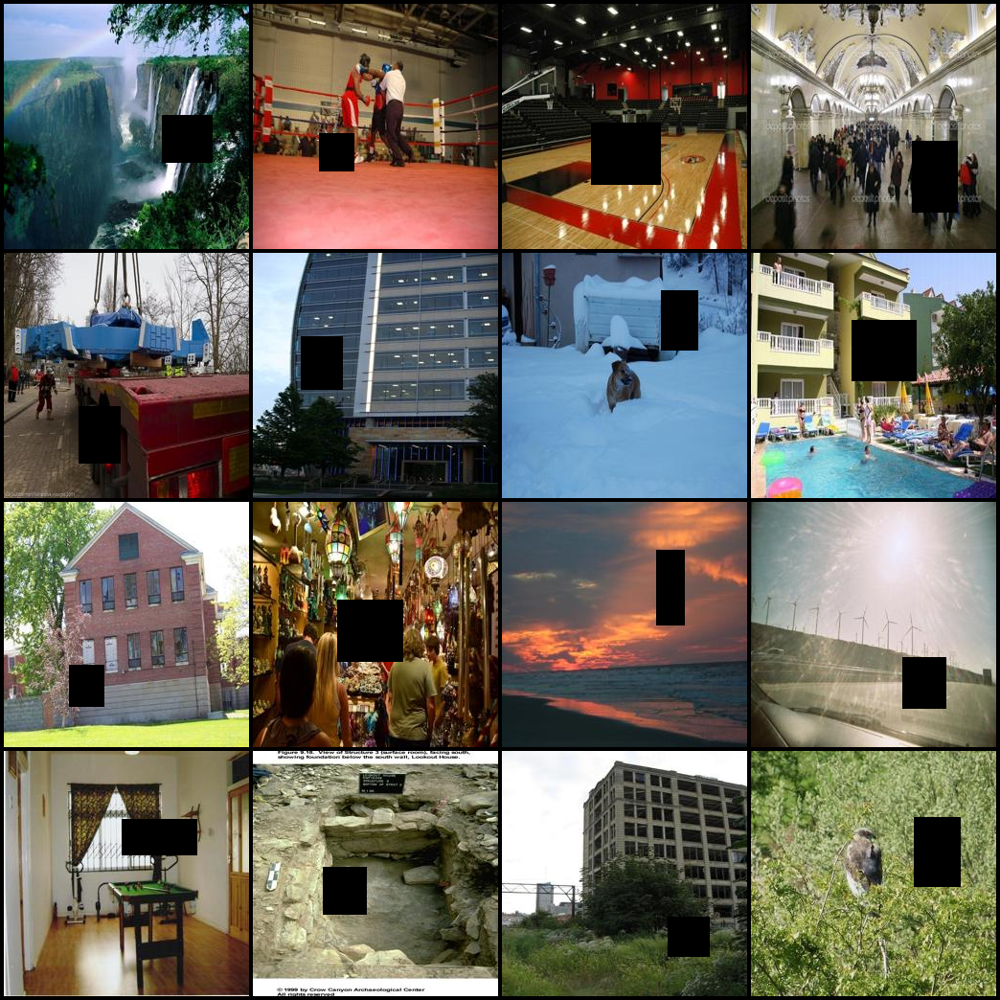

In [63]:
dataloader2 = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=workers)
dl_iter2 = iter(dataloader2)
test_batch = next(dl_iter2)[0].to(device)
test_batch = mask_batch(test_batch, device=device)[:, :3, ...]
grid = make_grid(test_batch, padding=4, normalize=True, nrow=4)
imshow(image_from_tensor(grid))

In [136]:
def compare_generators(unet, deepfill, unet_model, deepfill_model, test_batch, device, **kwargs):
    test_mask = mask_batch(test_batch, device=device).to(device)
    unet = load_generator(unet, unet_model, device)
    deepfill = load_generator(deepfill, deepfill_model, device, **kwargs)
    with torch.no_grad():
        res_unet = unet(test_mask)
        deepfill_pre_refine, res_deepfill = deepfill(test_mask)
        for i in range(batch_size):
            img = test_mask[i][:3, ...]
            img_real = test_batch[i][:3, ...]
            imshow(np.concatenate([image_from_tensor(img_real), image_from_tensor(img), image_from_tensor(res_unet[i]), image_from_tensor(res_deepfill[i])], axis=1))

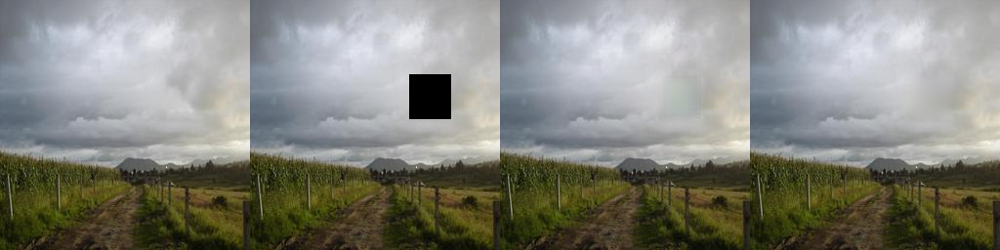

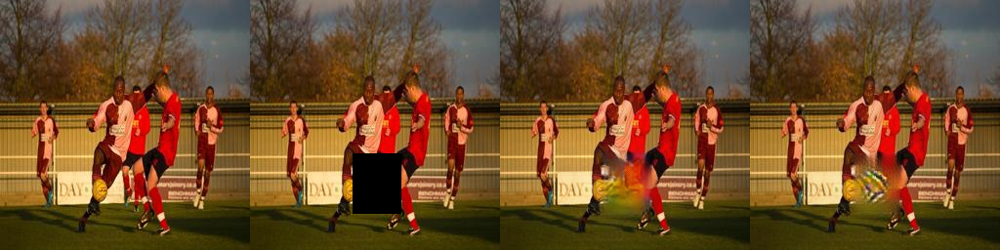

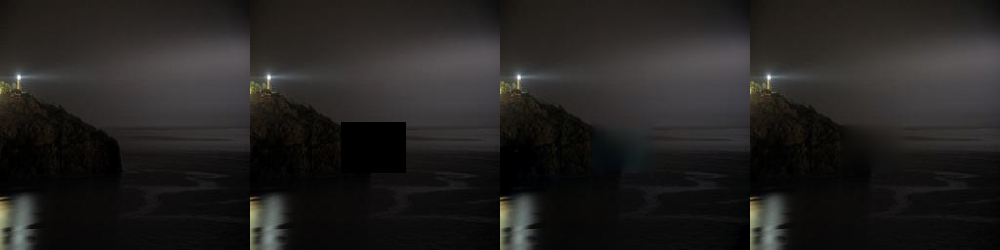

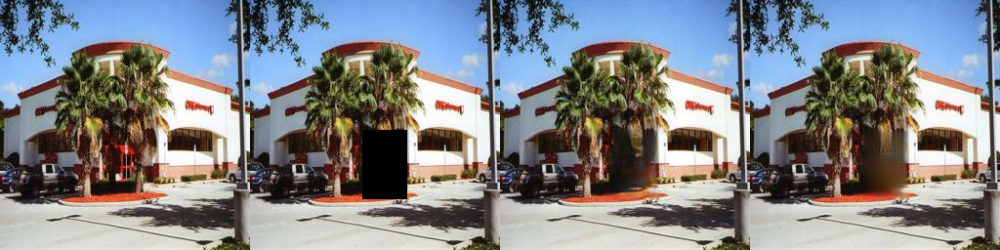

In [141]:
test_batch = next(dl_iter)[0].to(device)
compare_generators(
    "generator_unet_best.pth",
    "generator_deepfill_best.pth",
    UNet,
    DeepFill,
    test_batch,
    device,
    cnum=32)

In [146]:
dataloader2 = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=workers)
dl_iter2 = iter(dataloader2)

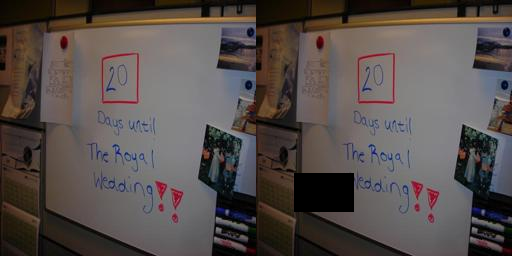

In [ ]:
test_img = next(dl_iter2)[0].to(device)
img_masked = mask_batch(test_img, device=device).to(device)


In [152]:
UNet_model = load_generator("generator_unet_best.pth", UNet, device)
DeepFill_model = load_generator("generator_deepfill_best.pth", DeepFill, device, cnum=32)

In [151]:
%%timeit
UNet_model(img_masked)

8.6 ms ± 587 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [153]:
%%timeit
DeepFill_model(img_masked)

13.5 ms ± 1.57 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
